In [19]:
import cv2  
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth

# Изменим стандартный размер графиков matplotlib
WIDTH_SIZE = 15
HEIGHT_SIZE = 10
plt.rcParams["figure.figsize"] = [WIDTH_SIZE, HEIGHT_SIZE]

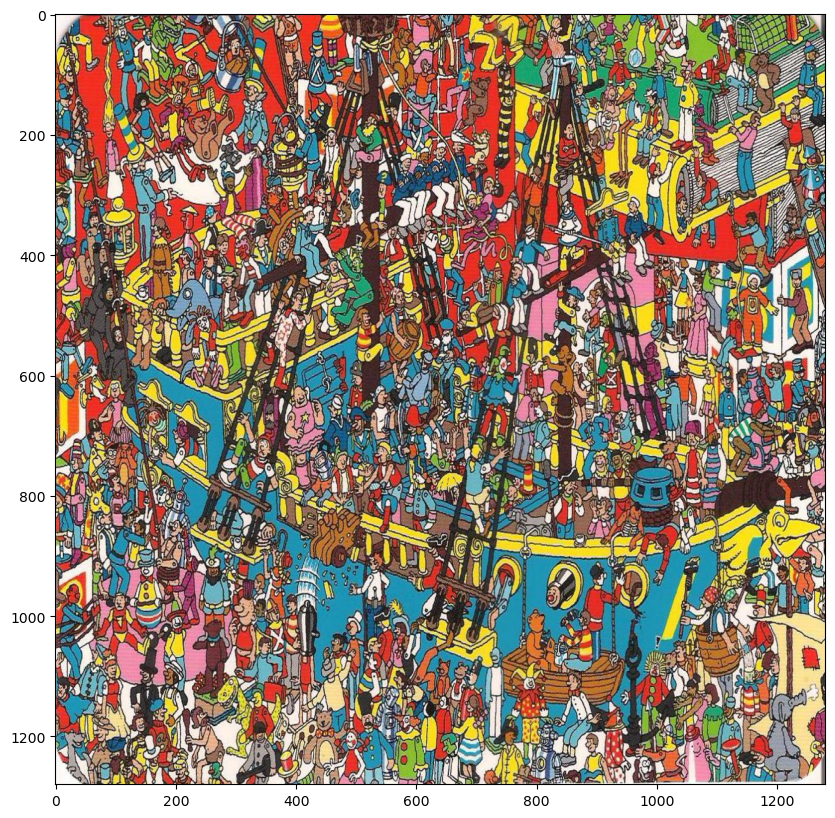

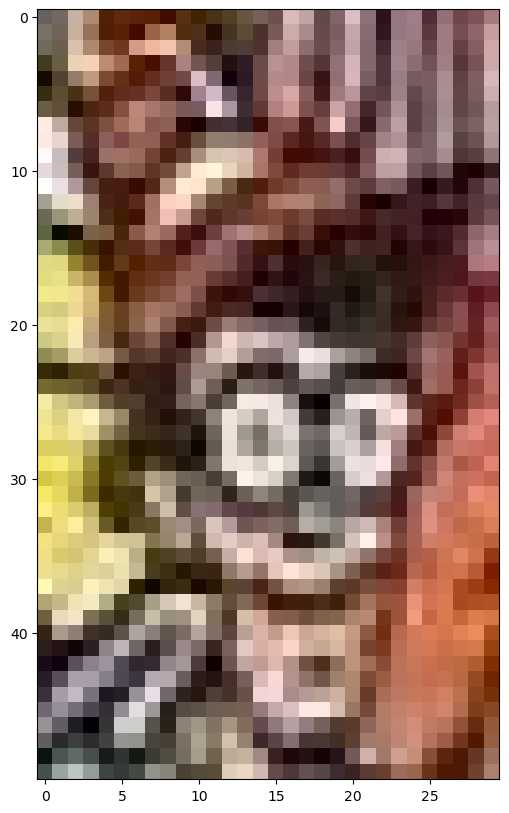

In [20]:
# Загружаем изображение
path1 = 'E:\\ant7.1Image.jpg'
path2 = 'E:\\ant7.2Image.jpg'
rgb_img = cv2.imread(path1) 
plt.figure()
plt.imshow(cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB))
# Преобразуем изображение в оттенки серого 
gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

# Загружаем шаблон  
template = cv2.imread(path2)
res = cv2.flip(template, 1)
plt.figure()
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))

# Преобразуем в оттенки серого
gray_templ = cv2.cvtColor(res, cv2.COLOR_BGR2GRAY)

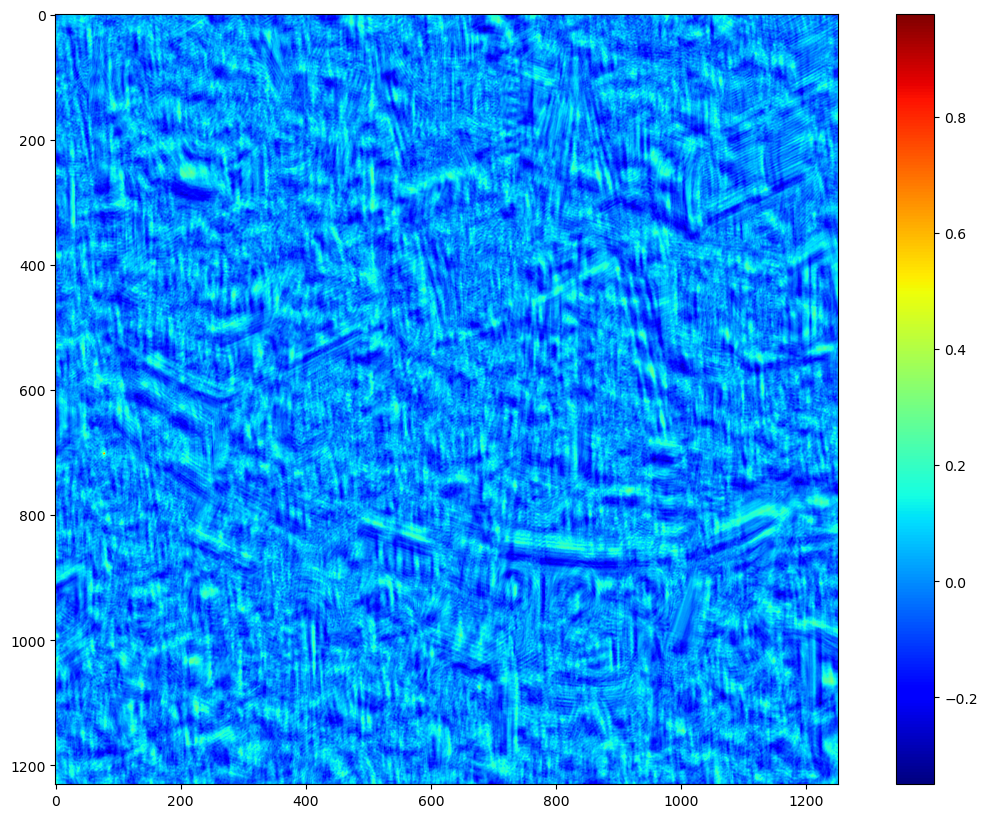

In [21]:
# Считаем размеры шаблона
w, h = template.shape[:-1] 
 
# Вызываем функцию cv2.matchTemplate для вычисления метрики схожести
# в качестве параметров передаем изображение, шаблон и тип вычисляемой метрики
res = cv2.matchTemplate(gray_img,gray_templ,cv2.TM_CCOEFF_NORMED)  

# Возможные варианты метрик:
#    cv2.TM_SQDIFF — сумма квадратов разниц значений пикселей
#    cv2.TM_SQDIFF_NORMED — сумма квадрат разниц цветов, отнормированная в диапазон 0..1.
#    cv2.TM_CCORR — сумма поэлементных произведений шаблона и сегмента картинки
#    cv2.TM_CCORR_NORMED — сумма поэлементных произведений, отнормированное в диапазон -1..1.
#    cv2.TM_CCOEFF — кросс-коррелация изображений без среднего
#    cv2.TM_CCOEFF_NORMED — кросс-корреляция между изображениями без среднего, отнормированная в -1..1 (корреляция Пирсона)
plt.figure()
plt.imshow(res, cmap='jet')
plt.colorbar()

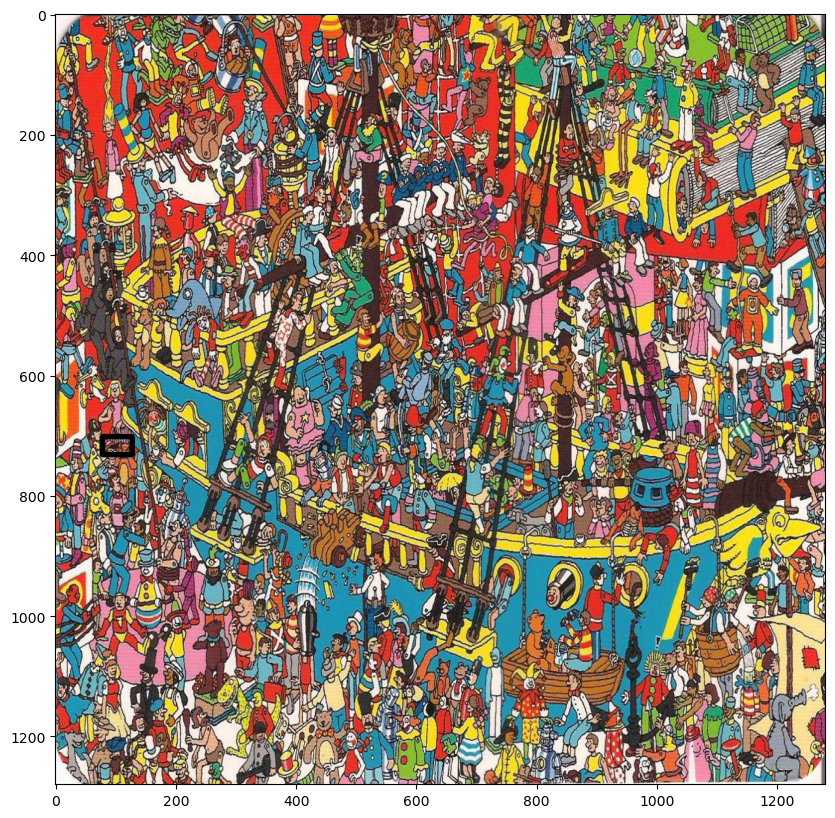

In [22]:
threshold = 0.8
loc = np.where(res >= threshold) 
# Вокруг выделенных максимумов обводим прямоугольники с размерами шаблона
plot_img = rgb_img.copy()
for pt in zip(*loc[::-1]):
    cv2.rectangle(plot_img, pt,(pt[0] + w, pt[1] + h),(0,0,0), 8)  

# Отображаем результат на графике
plt.figure()
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))

In [23]:
# cv2.imwrite('ResultImage1.jpg', plot_img)

(Text(0.5, 1.0, 'Sobel'), ([], []), ([], []))

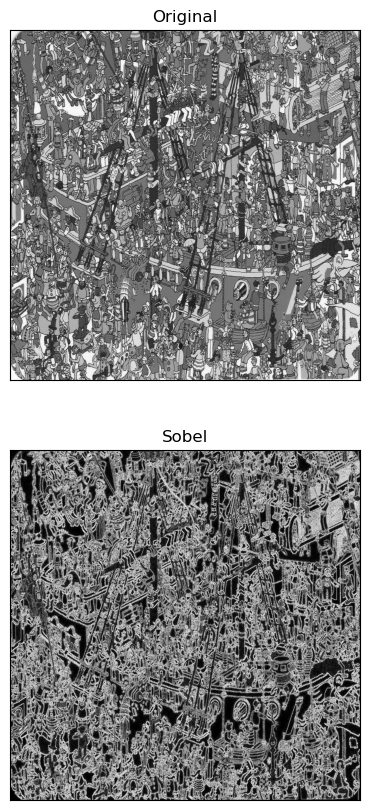

In [33]:
# Границы вычисляем на изображении в оттенках серого
imgG = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

# Для выделения границ используем фильтр Собеля в двух направлениях
x = cv2.Sobel(imgG,cv2.CV_16S,1,0)  
y = cv2.Sobel(imgG,cv2.CV_16S,0,1)  

# берем модуль от результата применения фильтра Собеля
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)  
  
# объединяем "вертикальные" и "горизонтальные" границы в одно изображение
dstI = cv2.addWeighted(absX,0.5,absY,0.5,0)
plt.figure()
plt.subplot(2,1,1),plt.imshow(imgG,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,1,2),plt.imshow(dstI,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Sobel'), ([], []), ([], []))

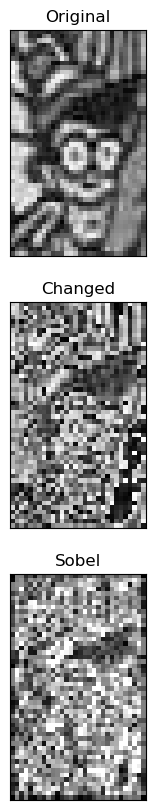

In [43]:
tmpG = 2*cv2.cvtColor(cv2.flip(template, 1), cv2.COLOR_BGR2GRAY)
x = cv2.Sobel(tmpG,cv2.CV_16S,1,0)  
y = cv2.Sobel(tmpG,cv2.CV_16S,0,1)  
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)  
dstT = cv2.addWeighted(absX,0.5,absY,0.5,0)

plt.subplot(3,1,1),plt.imshow(cv2.cvtColor(cv2.flip(template, 1), cv2.COLOR_BGR2GRAY),cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,2),plt.imshow(tmpG,cmap = 'gray')
plt.title('Changed'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,3),plt.imshow(dstT,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

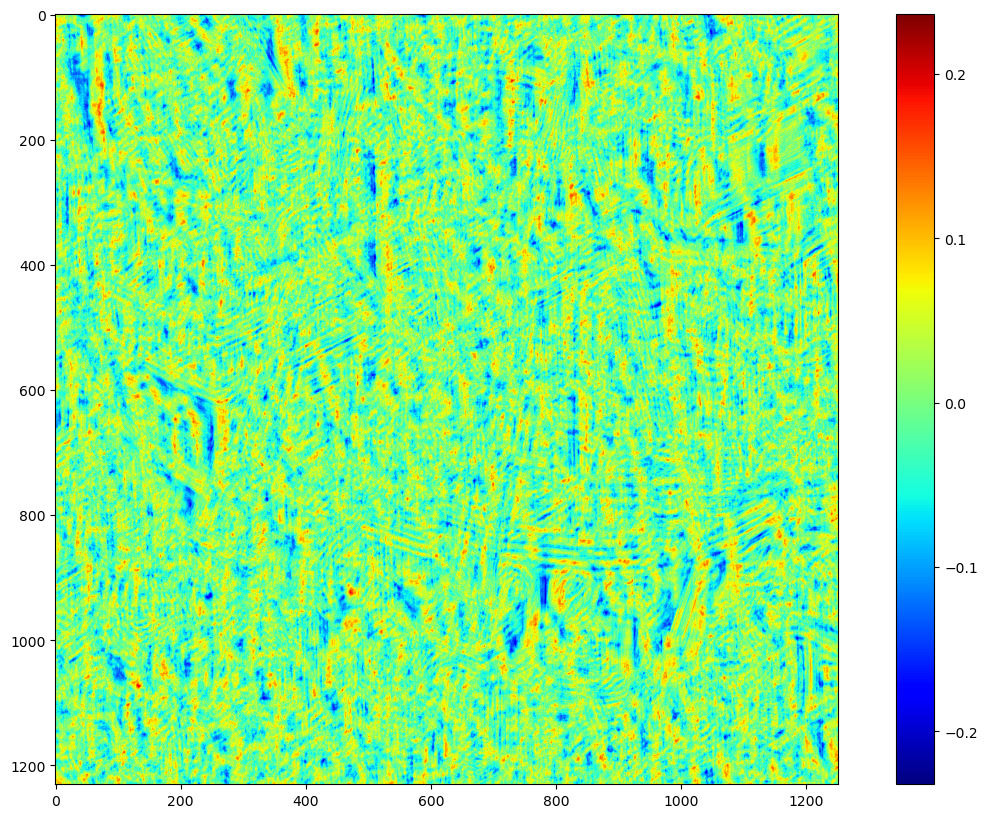

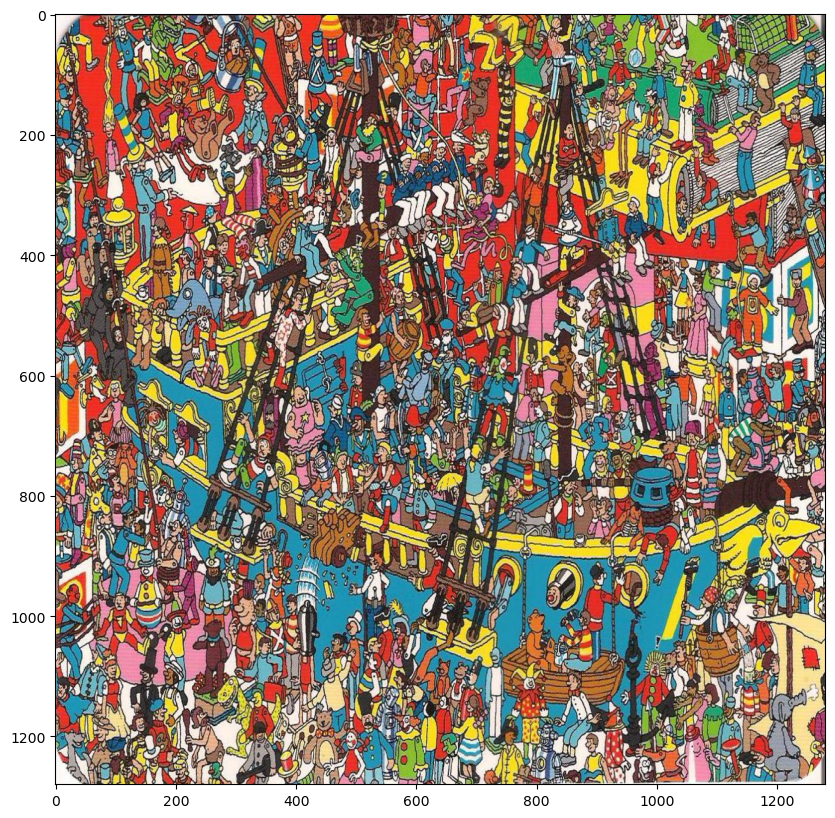

In [44]:
# Считаем размеры шаблона
w, h = tmpG.shape
  
# Вычисляем метрику схожести  
res = cv2.matchTemplate(dstI,dstT,cv2.TM_CCOEFF_NORMED)  
plt.figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
plt.imshow(res, cmap='jet')
plt.colorbar()

#  Отбираем максимумы и строим результат на графике
threshold = 0.7
loc = np.where(res >= threshold)  
plot_img = rgb_img.copy()
for pt in zip(*loc[::-1]):
    cv2.rectangle(plot_img, pt,(pt[0] + w, pt[1] + h),(0,0,0), 8)  

plt.figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))

(2.334887742996216, 303.0644226074219)
2.4606945514678955
270.4032897949219
0.04712362587451935
2.4606945514678955


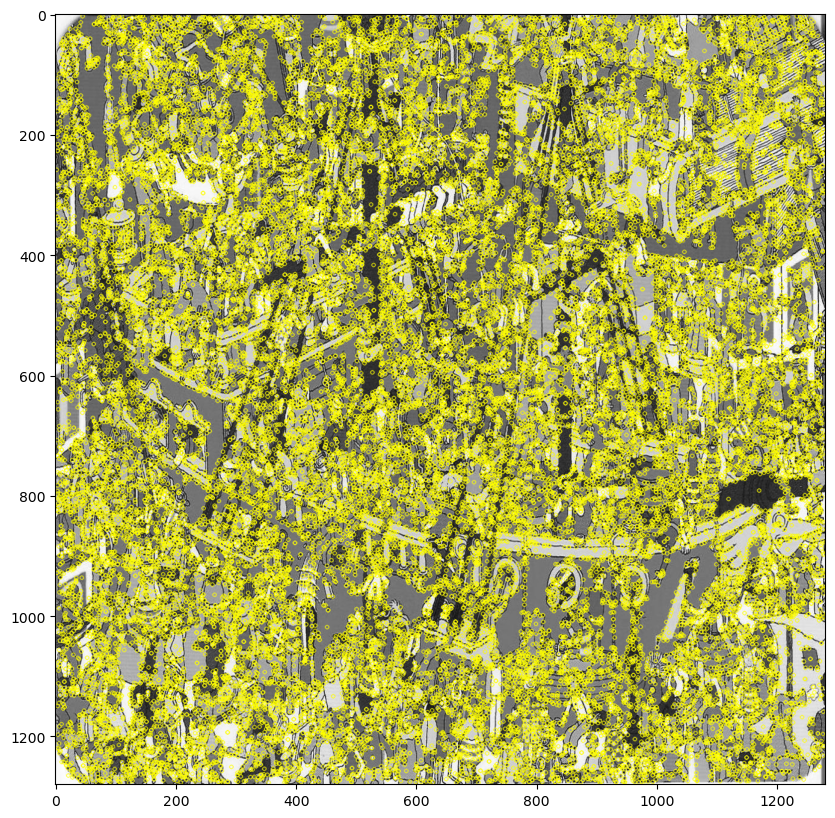

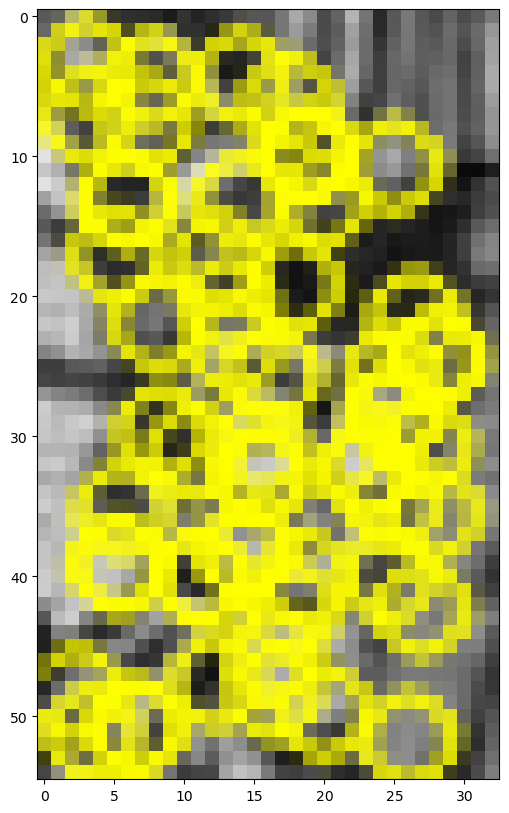

In [37]:
# Преобразуем и вносим небольшие изменения в шаблон

# Преобразуем в оттенки серого
scale = 1.1 # масштаб изменения размеров
scBr = 0.9 # коэффициент изменения яркости

template_scale = cv2.resize(np.uint8(0.9*cv2.cvtColor(cv2.flip(template, 1), cv2.COLOR_BGR2GRAY)),
           (int(cv2.flip(template, 1).shape[1]*scale), int(cv2.flip(template, 1).shape[0]*scale)), interpolation = cv2.INTER_AREA)

# Создаем детектор особых точек
sift = cv2.SIFT_create()
# sift = cv2.xfeatures2d.SIFT_create() # В зависимости от версии opencv может работать эта команда

# Запускаем детектор на изображении и на шаблоне
# Метод возвращает список особых точек и их дескрипторов
k_1, des_1 = sift.detectAndCompute(gray_img, None)
k_2, des_2 = sift.detectAndCompute(template_scale, None)

# Каждая особая точка имеет несколько параметров, таких как координаты, 
# размер, угол ориентации, мощность отклика и размер области особой точки.
print(k_1[1].pt)
print(k_1[1].size)
print(k_1[1].angle)
print(k_1[1].response)
print(k_1[1].size)

# Отрисуем найденные точки на картинке
image_key_point = cv2.drawKeypoints(gray_img, k_1, des_1, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(image_key_point, cv2.COLOR_BGR2RGB))

# Отрисуем найденные точки на шаблоне
template_key_point = cv2.drawKeypoints(template_scale, k_2, des_2, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(template_key_point, cv2.COLOR_BGR2RGB))

In [38]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

In [39]:
matches = bf.match(des_1, des_2)

print(matches[1].queryIdx)
print(matches[1].trainIdx)
print(matches[1].distance)

1295
44
2269.0


1.868324875831604


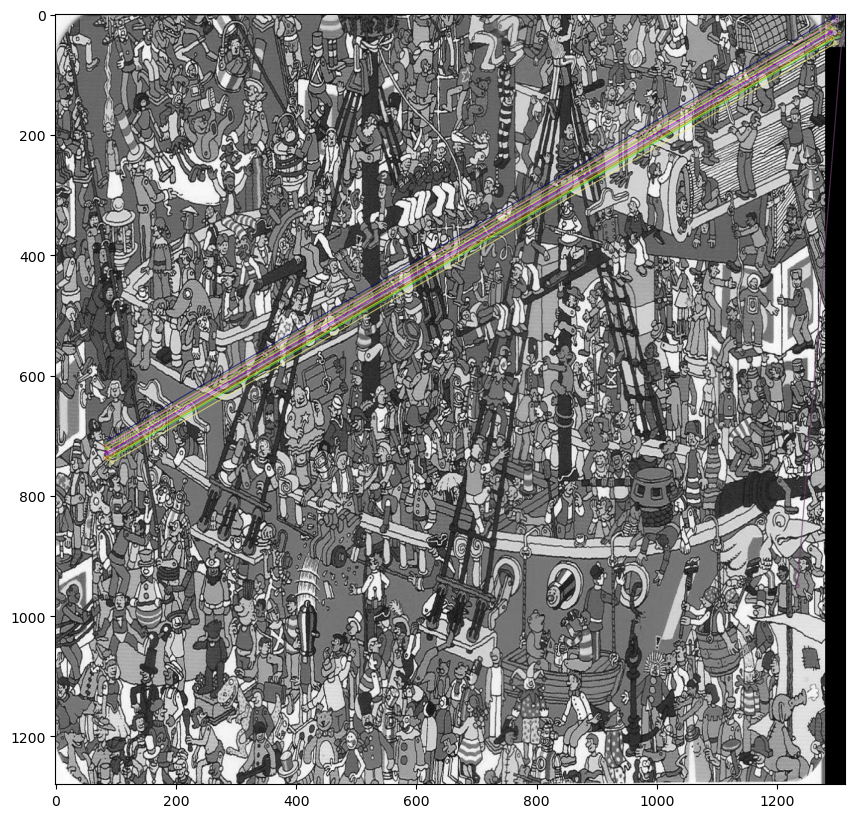

In [40]:
print(k_1[matches[1].queryIdx].size)
matches = sorted(matches, key=lambda x: x.distance)
image_with_matches = cv2.drawMatches(gray_img, k_1, template_scale, k_2, matches[:20], template_scale, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_matches, cv2.COLOR_BGR2RGB))

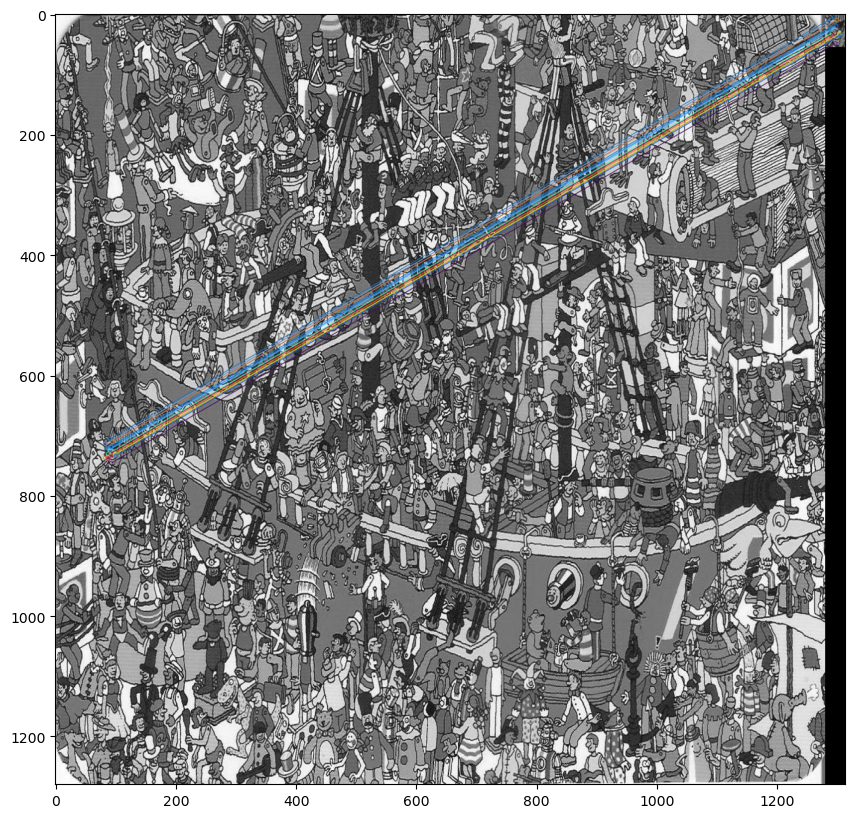

In [41]:
bf = cv2.BFMatcher(cv2.NORM_L1)
matches = bf.knnMatch(des_1, des_2, k=2)

# Лучшие пары особых точек отбираются с использованием теста отношения правдоподобия
good = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good.append([m])

# построим совпадения на изображении
image_with_knn_matches = cv2.drawMatchesKnn(gray_img,k_1,template_scale,k_2,good[:200],None,flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_knn_matches, cv2.COLOR_BGR2RGB))

[[ 83.07633209 737.49249268]
 [ 83.34066772 713.99975586]
 [ 83.34066772 713.99975586]
 [ 85.42672729 721.38568115]
 [ 87.83729553 730.59106445]
 [ 88.27658081 738.43377686]
 [ 88.27658081 738.43377686]
 [ 90.15531921 723.6003418 ]
 [ 90.87211609 705.87426758]
 [ 91.94373322 729.90771484]
 [ 92.9394455  745.96160889]
 [ 93.69223022 719.50299072]
 [ 95.00511932 711.01556396]
 [ 95.00511932 711.01556396]
 [ 99.00746918 731.57421875]
 [ 99.00746918 731.57421875]
 [100.80704498 733.64489746]]


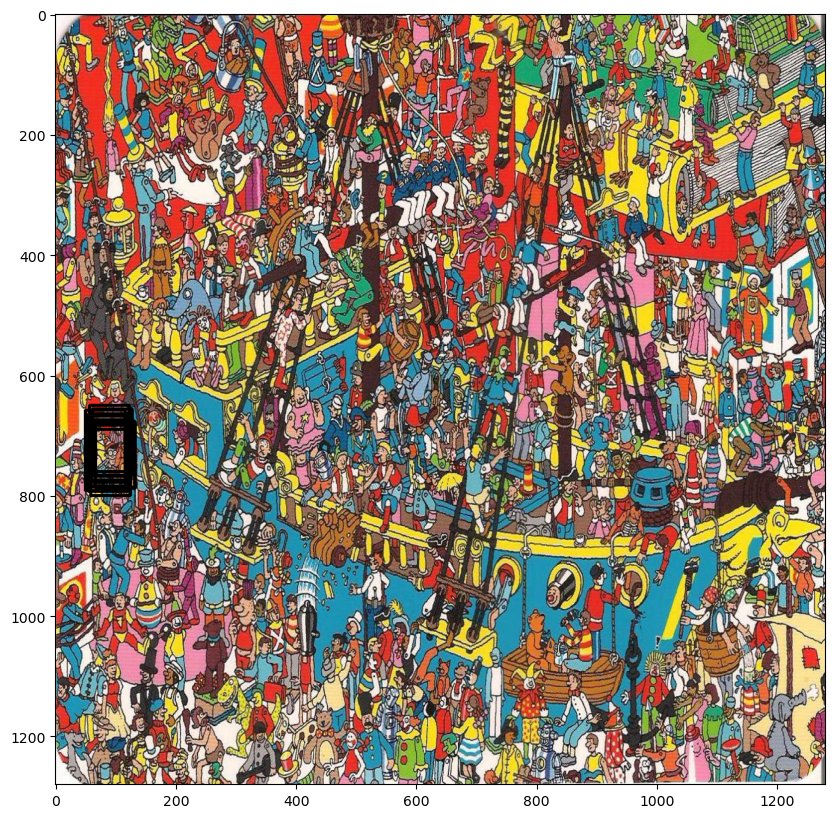

In [42]:
points = np.array([(0, 0)])
for i in good:
    points = np.append(points, [k_1[i[0].queryIdx].pt], axis=0)

points = points[1:len(points)]

# Определяем ширину окна и запускаем алгоритм кластеризации
bandwidth = estimate_bandwidth(points, quantile=0.1)
bandwidth = bandwidth + 0.1
ms = MeanShift(bandwidth=bandwidth, bin_seeding=False, cluster_all=False)
cl = ms.fit_predict(points)

# Формируем кластеры особых точек
labels_unique = np.unique(ms.labels_)
kp = []
for i in labels_unique:
    kp.append(points[cl==i])
print(points)
# Определяем центры кластеров, но только если в кластере содержится более 10 точек
cen = []
for i in kp:
#     if len(i)>10:
    cen.append(np.mean(i, axis=0).astype(np.uint16))

# Вокруг выделенных центров обводим прямоугольники с размерами шаблона
plot_img = rgb_img.copy()
h, w = template_scale.shape

for pt in cen:
    cv2.rectangle(plot_img, (pt[0] - w, pt[1] - h),(pt[0] + w, pt[1] + h),(0,0,0), 4)  

# Отображаем результат на графике
plt.figure()
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))